# Deep Learning: A Simple Example

- Let's get back to the Name Gender Classifier.

![](../images/keras-workflow.png)

## Prepare Data

In [1]:
## Packages Dependencies
import os
import shutil
import numpy as np
import nltk
from nltk.corpus import names
import random

from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

from lime.lime_text import LimeTextExplainer

import tensorflow as tf
import tensorflow.keras as keras

from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical, plot_model
from keras.models import Sequential
from keras import layers
    # from keras.layers import Dense
    # from keras.layers import LSTM, RNN, GRU
    # from keras.layers import Embedding
    # from keras.layers import SpatialDropout1D

import kerastuner

In [2]:
labeled_names = ([(name, 1) for name in names.words('male.txt')] +
                 [(name, 0) for name in names.words('female.txt')])
random.shuffle(labeled_names)

## Train-Test Split

In [3]:
train_set, test_set = train_test_split(labeled_names,
                                       test_size=0.2,
                                       random_state=42)
print(len(train_set), len(test_set))

6355 1589


In [4]:
names = [n for (n, l) in train_set]
labels = [l for (n, l) in train_set]

In [5]:
len(names)

6355

## Tokenizer

- By default, the token index 0 is reserved for padding token.
- If `oov_token` is specified, it is default to index 1.
- Specify `num_words` for tokenizer to include only top N words in the model
- Tokenizer will automatically remove puntuations.
- Tokenizer use whitespace as word delimiter.
- If every character is treated as a token, specify `char_level=True`.

In [6]:
tokenizer = Tokenizer(char_level=True)
tokenizer.fit_on_texts(names) ## similar to CountVectorizer.fit_transform()

## Prepare Input and Output Tensors

- Like in feature-based machine translation, a computational model only accepts numeric values. It is necessary to convert raw text to numeric tensor for neural network.
- After we create the Tokenizer, we use the Tokenizer to perform text vectorization, i.e., converting texts into tensors.
- In deep learning, words or characters are automatically converted into numeric representations.
- In other words, the feature engineering step is fully automatic.

### Two Ways of Text Vectorization

- Texts to Sequences: **Integer encoding** of tokens in texts and learn token **embeddings**
- Texts to Matrix: **One-hot encoding** of texts (similar to bag-of-words model)


## Method 1: Text to Sequences

### From Texts and Sequences

- Text to Sequences
- Padding to uniform lengths for each text

In [7]:
names_ints = tokenizer.texts_to_sequences(names)

In [8]:
print(names[:10])
print(names_ints[:10])
print(labels[:10])

['Evania', 'Coleen', 'Marylinda', 'Magnus', 'Harrietta', 'Ephrayim', 'Josselyn', 'Victoria', 'Corette', 'Alberto']
[[2, 20, 1, 4, 3, 1], [14, 7, 6, 2, 2, 4], [11, 1, 5, 12, 6, 3, 4, 10, 1], [11, 1, 17, 4, 16, 9], [13, 1, 5, 5, 3, 2, 8, 8, 1], [2, 22, 13, 5, 1, 12, 3, 11], [19, 7, 9, 9, 2, 6, 12, 4], [20, 3, 14, 8, 7, 5, 3, 1], [14, 7, 5, 2, 8, 8, 2], [1, 6, 15, 2, 5, 8, 7]]
[0, 0, 0, 1, 0, 1, 0, 0, 0, 1]


### Vocabulary

In [9]:
# determine the vocabulary size
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

Vocabulary Size: 30


In [10]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'm': 11,
 'y': 12,
 'h': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'j': 19,
 'v': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28,
 "'": 29}

### Padding

- When padding the all texts into uniform lengths, consider whether to Pre-padding or removing values from the beginning of the sequence (i.e., `pre`) or the other way (`post`).
-  Check `padding` and `truncating` parameters in `pad_sequences`

Helen-Elizabeth


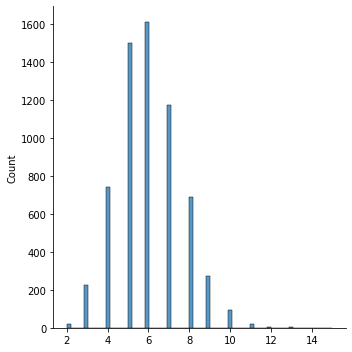

In [11]:
names_lens = [len(n) for n in names_ints]
names_lens

sns.displot(names_lens)
print(names[np.argmax(names_lens)])  # longest name

In [12]:
max_len = names_lens[np.argmax(names_lens)]
max_len

15

In [13]:
names_ints_pad = sequence.pad_sequences(names_ints, maxlen=max_len)
names_ints_pad[:10]

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  2, 20,  1,  4,  3,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 14,  7,  6,  2,  2,  4],
       [ 0,  0,  0,  0,  0,  0, 11,  1,  5, 12,  6,  3,  4, 10,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 11,  1, 17,  4, 16,  9],
       [ 0,  0,  0,  0,  0,  0, 13,  1,  5,  5,  3,  2,  8,  8,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  2, 22, 13,  5,  1, 12,  3, 11],
       [ 0,  0,  0,  0,  0,  0,  0, 19,  7,  9,  9,  2,  6, 12,  4],
       [ 0,  0,  0,  0,  0,  0,  0, 20,  3, 14,  8,  7,  5,  3,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 14,  7,  5,  2,  8,  8,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  1,  6, 15,  2,  5,  8,  7]],
      dtype=int32)

### Define X and Y

In [14]:
X_train = np.array(names_ints_pad).astype('int32')
y_train = np.array(labels)

X_test = np.array(
    sequence.pad_sequences(tokenizer.texts_to_sequences(
        [n for (n, l) in test_set]),
                           maxlen=max_len)).astype('int32')
y_test = np.array([l for (n, l) in test_set])

X_test_texts = [n for (n, l) in test_set]

In [15]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6355, 15)
(6355,)
(1589, 15)
(1589,)


## Method 2: Text to Matrix

### One-Hot Encoding

- Text to Matrix (to create bag-of-word representation of each text)
- Choose modes: binary, count, or tfidf

In [16]:
names_matrix = tokenizer.texts_to_matrix(names, mode="binary")

In [17]:
names[2]

'Marylinda'

- `names_matrix` in fact is a bag-of-characters representation of a name text.

In [18]:
pd.DataFrame(names_matrix[2, 1:],
             columns=["ONE-HOT"],
             index=list(tokenizer.word_index.keys()))

,ONE-HOT
a,1.0
e,0.0
i,1.0
n,1.0
r,1.0
l,1.0
o,0.0
t,0.0
s,0.0
d,1.0


### Define X and Y

In [19]:
X_train2 = np.array(names_matrix).astype('int32')
y_train2 = np.array(labels)

X_test2 = tokenizer.texts_to_matrix([n for (n, l) in test_set],
                                    mode="binary").astype('int32')
y_test2 = np.array([l for (n, l) in test_set])

X_test2_texts = [n for (n, l) in test_set]

In [20]:
print(X_train2.shape)
print(y_train2.shape)
print(X_test2.shape)
print(y_test2.shape)

(6355, 30)
(6355,)
(1589, 30)
(1589,)


## Model Definition

- Three important steps for building a deep neural network:
    - **Define** the model structure 
    - **Compile** the model
    - **Fit** the model

- After we have defined our input and output tensors (X and y), we can define the architecture of our neural network model.
- For the two ways of name vectorized representations, we try two different network structures.
    - Text to Matrix: Fully connected Dense Layers
    - Text to Sequences: Embedding + RNN


In [21]:
# Plotting results
def plot1(history):

    matplotlib.rcParams['figure.dpi'] = 100
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)
    ## Accuracy plot
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    ## Loss plot
    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()


def plot2(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    #plt.gca().set_ylim(0,1)
    plt.show()

### Model 1: Fully Connected Dense Layers

- Let's try a simple neural network with two fully-connected dense layers with the Text-to-Matrix inputs.
- That is, the input of this model is the bag-of-words representation of the entire name.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.002.jpeg)

#### Dense Layer Operation

- The transformation of each Dense layer will transform the input tensor into a tensor whose dimension size is the same as the node number of the Dense layer.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.003.jpeg)

In [22]:
## Define Model

model1 = keras.Sequential()
model1.add(keras.Input(shape=(vocab_size, ), name="one_hot_input"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_1"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_2"))
model1.add(layers.Dense(1, activation="sigmoid", name="output"))

In [23]:
## Compile Model
model1.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

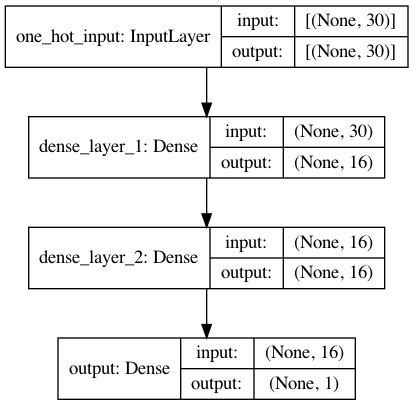

In [24]:
plot_model(model1, show_shapes=True)

#### A few hyperparameters for network training

- Batch Size: The number of inputs needed per update of the model parameter (gradient descent)
- Epoch: How many iterations needed for training
- Validation Split Ratio: Proportion of validation and training data split

In [25]:
## Hyperparameters
BATCH_SIZE = 128
EPOCHS = 20
VALIDATION_SPLIT = 0.2

In [26]:
## Fit the model
history1 = model1.fit(X_train2,
                      y_train2,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6878 - accuracy: 0.5507 - val_loss: 0.6711 - val_accuracy: 0.6444
Epoch 2/20
40/40 - 0s - loss: 0.6621 - accuracy: 0.6298 - val_loss: 0.6467 - val_accuracy: 0.6483
Epoch 3/20
40/40 - 0s - loss: 0.6383 - accuracy: 0.6479 - val_loss: 0.6231 - val_accuracy: 0.6648
Epoch 4/20
40/40 - 0s - loss: 0.6165 - accuracy: 0.6672 - val_loss: 0.6077 - val_accuracy: 0.6884
Epoch 5/20
40/40 - 0s - loss: 0.6026 - accuracy: 0.6755 - val_loss: 0.5958 - val_accuracy: 0.6939
Epoch 6/20
40/40 - 0s - loss: 0.5928 - accuracy: 0.6827 - val_loss: 0.5889 - val_accuracy: 0.6994
Epoch 7/20
40/40 - 0s - loss: 0.5858 - accuracy: 0.6878 - val_loss: 0.5840 - val_accuracy: 0.6994
Epoch 8/20
40/40 - 0s - loss: 0.5804 - accuracy: 0.6947 - val_loss: 0.5814 - val_accuracy: 0.6955
Epoch 9/20
40/40 - 0s - loss: 0.5765 - accuracy: 0.7012 - val_loss: 0.5795 - val_accuracy: 0.6900
Epoch 10/20
40/40 - 0s - loss: 0.5737 - accuracy: 0.7034 - val_loss: 0.5774 - val_accuracy: 0.6932
Epoch 11/20
40/40 -

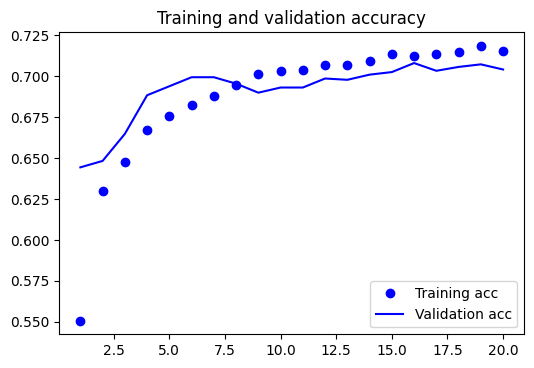

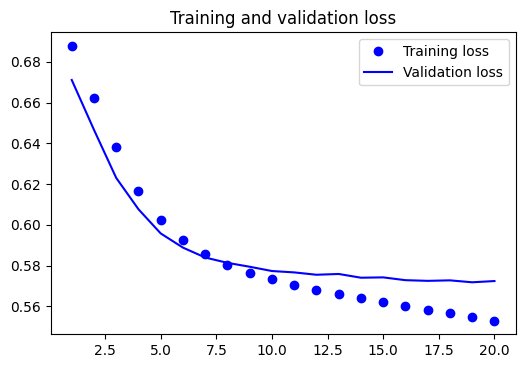

In [27]:
plot1(history1)

In [28]:
model1.evaluate(X_test2, y_test2, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.5528 - accuracy: 0.7256


[0.5528222322463989, 0.7256135940551758]

### Model 2: Embedding + RNN

- Another possibility is to introduce an embedding layer in the network, which transforms each **character** in the name into a tensor (i.e., embeddings), and then to add a Recurrent Neural Network layer to process each character sequentially.
- The strength of the RNN is that it iterates over the **timesteps** of a sequence, while maintaining an internal state that encodes information about the **timesteps** it has seen so far.
- It is posited that after the RNN iterates through the entire sequence, it keeps important information of all previously iterated tokens for further operation.

- The input of this network is a padded sequence of the original text (name).

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.004.jpeg)

#### Embedding Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.005.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.006.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.007.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.008.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.009.jpeg)

In [29]:
## Define the embedding dimension
EMBEDDING_DIM = 128

## Define model
model2 = Sequential()
model2.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model2.add(layers.SimpleRNN(16, activation="relu", name="RNN_layer"))
model2.add(layers.Dense(16, activation="relu", name="dense_layer"))
model2.add(layers.Dense(1, activation="sigmoid", name="output"))

model2.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

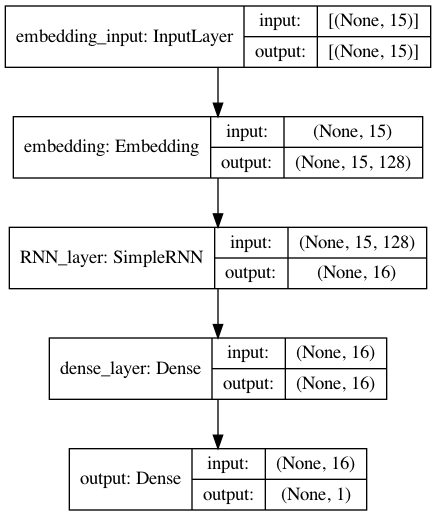

In [30]:
plot_model(model2, show_shapes=True)

In [31]:
history2 = model2.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6144 - accuracy: 0.6279 - val_loss: 0.5316 - val_accuracy: 0.6593
Epoch 2/20
40/40 - 0s - loss: 0.5093 - accuracy: 0.7260 - val_loss: 0.4827 - val_accuracy: 0.7640
Epoch 3/20
40/40 - 0s - loss: 0.4748 - accuracy: 0.7669 - val_loss: 0.4627 - val_accuracy: 0.7703
Epoch 4/20
40/40 - 0s - loss: 0.4533 - accuracy: 0.7748 - val_loss: 0.4344 - val_accuracy: 0.7923
Epoch 5/20
40/40 - 0s - loss: 0.4306 - accuracy: 0.7884 - val_loss: 0.4231 - val_accuracy: 0.8009
Epoch 6/20
40/40 - 0s - loss: 0.4165 - accuracy: 0.8000 - val_loss: 0.4109 - val_accuracy: 0.8088
Epoch 7/20
40/40 - 0s - loss: 0.4054 - accuracy: 0.8059 - val_loss: 0.4060 - val_accuracy: 0.8041
Epoch 8/20
40/40 - 0s - loss: 0.3977 - accuracy: 0.8120 - val_loss: 0.4054 - val_accuracy: 0.8120
Epoch 9/20
40/40 - 0s - loss: 0.3943 - accuracy: 0.8104 - val_loss: 0.4029 - val_accuracy: 0.8104
Epoch 10/20
40/40 - 0s - loss: 0.3870 - accuracy: 0.8163 - val_loss: 0.4043 - val_accuracy: 0.8088
Epoch 11/20
40/40 -

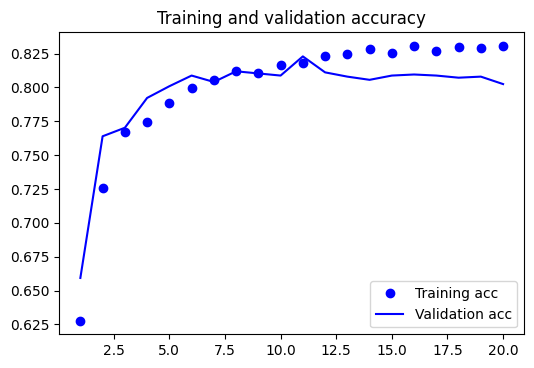

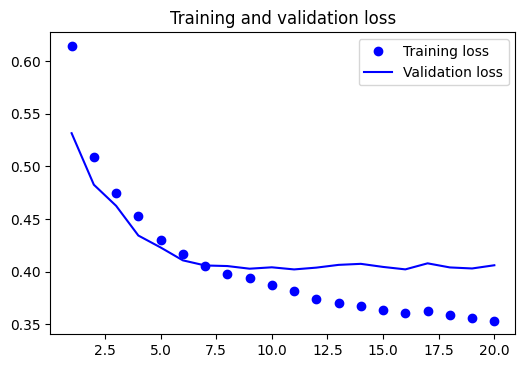

In [32]:
plot1(history2)

In [33]:
model2.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4022 - accuracy: 0.8143


[0.4022144079208374, 0.8143486380577087]

### Model 3: Regularization and Dropout

- Based on the validation results of the previous two models, we can see that they are probably a bit overfit because the model performance on the validation set starts to stall after the first few epochs.
- We can add **regularization** and **dropouts** in our network definition to avoid overfitting.

In [34]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model3 = Sequential()
model3.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model3.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer",
                     dropout=0.2,
                     recurrent_dropout=0.2))  ## add dropout
model3.add(layers.Dense(16, activation="relu", name="dense_layer"))
model3.add(layers.Dense(1, activation="sigmoid", name="output"))

model3.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

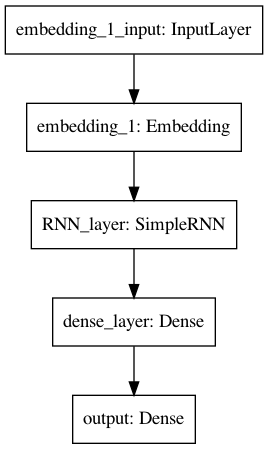

In [35]:
plot_model(model3)

In [36]:
history3 = model3.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6315 - accuracy: 0.6271 - val_loss: 0.5498 - val_accuracy: 0.6475
Epoch 2/20
40/40 - 0s - loss: 0.5299 - accuracy: 0.6914 - val_loss: 0.4855 - val_accuracy: 0.7655
Epoch 3/20
40/40 - 0s - loss: 0.4875 - accuracy: 0.7565 - val_loss: 0.4590 - val_accuracy: 0.7821
Epoch 4/20
40/40 - 0s - loss: 0.4722 - accuracy: 0.7675 - val_loss: 0.4490 - val_accuracy: 0.7899
Epoch 5/20
40/40 - 0s - loss: 0.4596 - accuracy: 0.7707 - val_loss: 0.4348 - val_accuracy: 0.7978
Epoch 6/20
40/40 - 0s - loss: 0.4477 - accuracy: 0.7828 - val_loss: 0.4256 - val_accuracy: 0.8049
Epoch 7/20
40/40 - 0s - loss: 0.4471 - accuracy: 0.7832 - val_loss: 0.4221 - val_accuracy: 0.8017
Epoch 8/20
40/40 - 0s - loss: 0.4413 - accuracy: 0.7880 - val_loss: 0.4214 - val_accuracy: 0.8025
Epoch 9/20
40/40 - 0s - loss: 0.4415 - accuracy: 0.7854 - val_loss: 0.4190 - val_accuracy: 0.7994
Epoch 10/20
40/40 - 0s - loss: 0.4355 - accuracy: 0.7842 - val_loss: 0.4174 - val_accuracy: 0.7970
Epoch 11/20
40/40 -

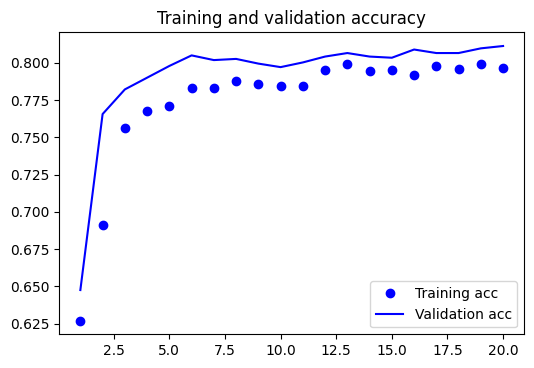

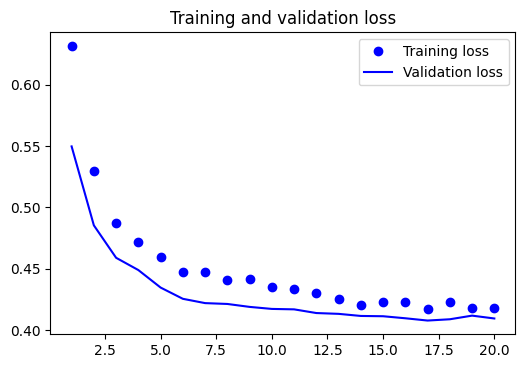

In [37]:
plot1(history3)

In [38]:
model3.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4079 - accuracy: 0.8112


[0.4079383909702301, 0.8112019896507263]

### Model 4: Improve the Models

- In addition to regularization and dropouts, we can further improve the model by increasing the model **complexity**.
- In particular, we can increase the **depths** and **widths** of the network layers.
- Let's try stacking two RNN layers.

:::{tip}

When we stack two sequence layers (e.g., RNN), we need to make sure that the hidden states (outputs) of the first sequence layer at **all timesteps** are properly passed onto the next sequence layer, not just the hidden state (output) of the last timestep.

In keras, this usually means that we need to set the argument `return_sequences=True` in a sequence layer (e.g., `SimpleRNN`, `LSTM`, `GRU` etc).

:::

In [39]:
## Define embedding dimension
MBEDDING_DIM = 128

## Define model
model4 = Sequential()
model4.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_1",
                     dropout=0.2,
                     recurrent_dropout=0.5,
                     return_sequences=True)
)  ## To ensure the hidden states of all timesteps are pased down to next layer
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_2",
                     dropout=0.2,
                     recurrent_dropout=0.5))
model4.add(layers.Dense(1, activation="sigmoid", name="output"))

## Compile model
model4.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

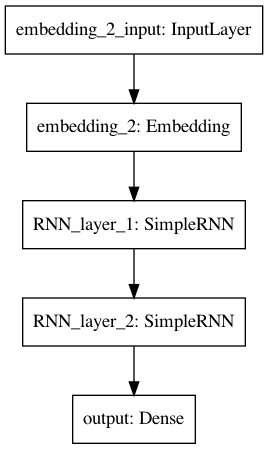

In [40]:
plot_model(model4)

In [41]:
history4 = model4.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 3s - loss: 0.6791 - accuracy: 0.5997 - val_loss: 0.6403 - val_accuracy: 0.6389
Epoch 2/20
40/40 - 1s - loss: 0.6407 - accuracy: 0.6536 - val_loss: 0.6030 - val_accuracy: 0.6790
Epoch 3/20
40/40 - 0s - loss: 0.6107 - accuracy: 0.6808 - val_loss: 0.5603 - val_accuracy: 0.7380
Epoch 4/20
40/40 - 1s - loss: 0.5676 - accuracy: 0.7173 - val_loss: 0.5159 - val_accuracy: 0.7624
Epoch 5/20
40/40 - 1s - loss: 0.5468 - accuracy: 0.7339 - val_loss: 0.5006 - val_accuracy: 0.7655
Epoch 6/20
40/40 - 0s - loss: 0.5226 - accuracy: 0.7441 - val_loss: 0.4832 - val_accuracy: 0.7655
Epoch 7/20
40/40 - 0s - loss: 0.5121 - accuracy: 0.7386 - val_loss: 0.4737 - val_accuracy: 0.7671
Epoch 8/20
40/40 - 1s - loss: 0.4949 - accuracy: 0.7594 - val_loss: 0.4587 - val_accuracy: 0.7726
Epoch 9/20
40/40 - 0s - loss: 0.4915 - accuracy: 0.7585 - val_loss: 0.4584 - val_accuracy: 0.7718
Epoch 10/20
40/40 - 0s - loss: 0.4812 - accuracy: 0.7653 - val_loss: 0.4544 - val_accuracy: 0.7710
Epoch 11/20
40/40 -

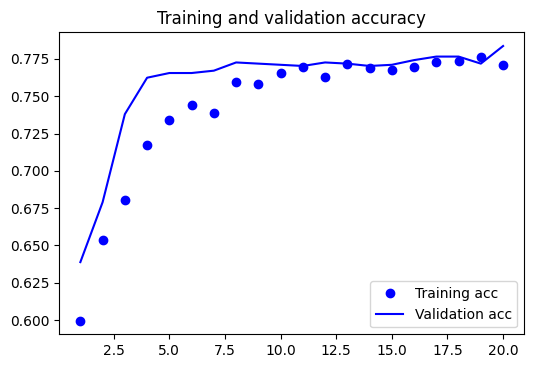

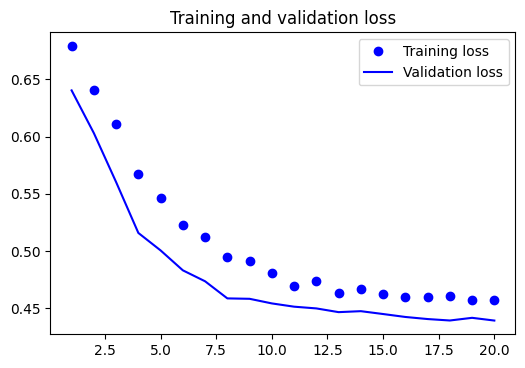

In [42]:
plot1(history4)

In [43]:
model4.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4512 - accuracy: 0.7835


[0.4511577785015106, 0.7835116386413574]

### Model 5: Bidirectional

- We can also increase the model complexity in at least two possible ways:
    - Use more advanced RNNs, such as LSTM or GRU
    - Process the sequence in two directions
    - Increase the hidden nodes of the RNN/LSTM
- Now let's try the more sophisticated RNN, LSTM, and with bidirectional sequence processing and add more nodes to the LSTM layer.

In [45]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model5 = Sequential()
model5.add(
    layers.Embedding(input_dim=vocab_size,
                      output_dim=EMBEDDING_DIM,
                      input_length=max_len,
                      mask_zero=True))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_1",
                    dropout=0.2,
                    recurrent_dropout=0.5,
                    return_sequences=True)))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_2",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model5.add(layers.Dense(1, activation="sigmoid", name="output"))

model5.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

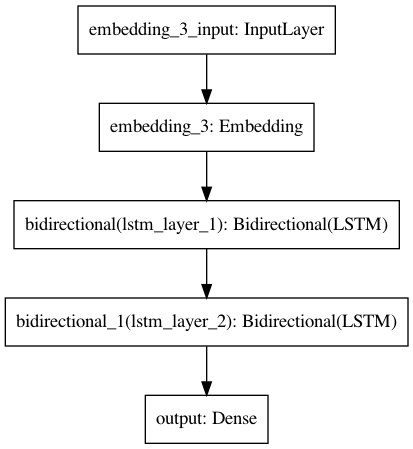

In [46]:
plot_model(model5)

In [47]:
history5 = model5.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 17s - loss: 0.6598 - accuracy: 0.6225 - val_loss: 0.6119 - val_accuracy: 0.6389
Epoch 2/20
40/40 - 2s - loss: 0.5888 - accuracy: 0.6560 - val_loss: 0.5200 - val_accuracy: 0.7498
Epoch 3/20
40/40 - 2s - loss: 0.5020 - accuracy: 0.7453 - val_loss: 0.4577 - val_accuracy: 0.7836
Epoch 4/20
40/40 - 2s - loss: 0.4773 - accuracy: 0.7681 - val_loss: 0.4610 - val_accuracy: 0.7781
Epoch 5/20
40/40 - 2s - loss: 0.4608 - accuracy: 0.7758 - val_loss: 0.4299 - val_accuracy: 0.7923
Epoch 6/20
40/40 - 2s - loss: 0.4474 - accuracy: 0.7805 - val_loss: 0.4275 - val_accuracy: 0.7868
Epoch 7/20
40/40 - 2s - loss: 0.4410 - accuracy: 0.7846 - val_loss: 0.4184 - val_accuracy: 0.7891
Epoch 8/20
40/40 - 2s - loss: 0.4340 - accuracy: 0.7862 - val_loss: 0.4128 - val_accuracy: 0.7954
Epoch 9/20
40/40 - 2s - loss: 0.4256 - accuracy: 0.7945 - val_loss: 0.4125 - val_accuracy: 0.7954
Epoch 10/20
40/40 - 2s - loss: 0.4226 - accuracy: 0.7921 - val_loss: 0.4071 - val_accuracy: 0.8025
Epoch 11/20
40/40 

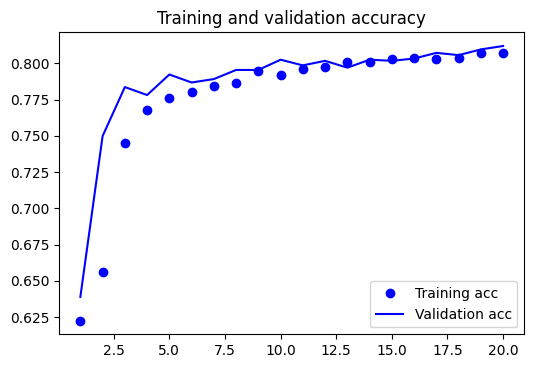

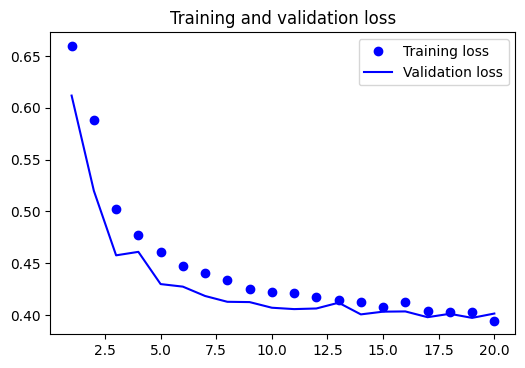

In [48]:
plot1(history5)

In [49]:
model5.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.3931 - accuracy: 0.8288


[0.3930891752243042, 0.8288231492042542]

## Check Embeddings

- Compared to one-hot encodings of characters, embeddings may include more information relating to the characteristics (semantics?) of the characters.
- We can extract the embedding layer and apply dimensional reduction techniques (i.e., TSNE) to see how embeddings capture the relationships in-between characters.

In [50]:
## A name in sequence from test set
X_test[10]

array([ 0,  0,  0,  0,  0,  0,  0,  9,  3, 11, 11,  7,  4, 10,  9],
      dtype=int32)

In [51]:
ind2char = tokenizer.index_word
[ind2char.get(i) for i in X_test[10] if ind2char.get(i) != None]

['s', 'i', 'm', 'm', 'o', 'n', 'd', 's']

In [52]:
tokenizer.texts_to_sequences('Alvin')

[[1], [6], [20], [3], [4]]

In [53]:
char_vectors = model5.layers[0].get_weights()[0]
char_vectors.shape

(30, 128)

In [54]:
labels = [char for (ind, char) in tokenizer.index_word.items()]
labels.insert(0, None)
labels

[None,
 'a',
 'e',
 'i',
 'n',
 'r',
 'l',
 'o',
 't',
 's',
 'd',
 'm',
 'y',
 'h',
 'c',
 'b',
 'u',
 'g',
 'k',
 'j',
 'v',
 'f',
 'p',
 'w',
 'z',
 'x',
 'q',
 '-',
 ' ',
 "'"]

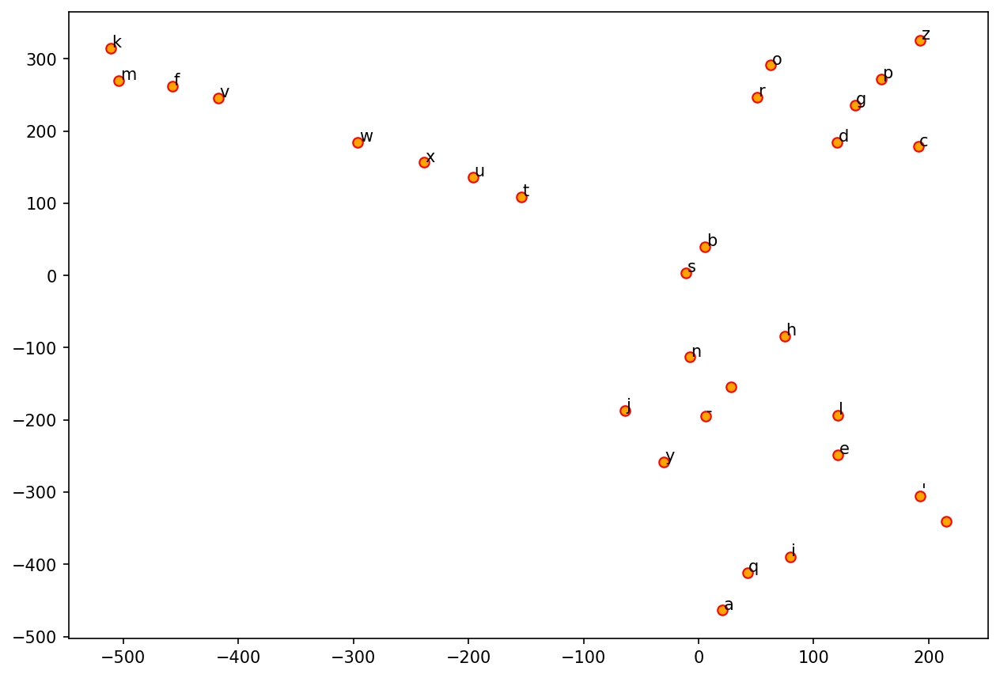

In [55]:
tsne = TSNE(n_components=2, random_state=0, n_iter=5000, perplexity=3)
np.set_printoptions(suppress=True)
T = tsne.fit_transform(char_vectors)
labels = labels

plt.figure(figsize=(10, 7), dpi=150)
plt.scatter(T[:, 0], T[:, 1], c='orange', edgecolors='r')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label,
                 xy=(x + 1, y + 1),
                 xytext=(0, 0),
                 textcoords='offset points')

## Issues of Word/Character Representations

- One-hot encoding does not indicate semantic relationships between characters.
- For deep learning NLP, it is preferred to convert one-hot encodings of words/characters into **embeddings**, which are argued to include more semantic information of the tokens.
- Now the question is how to train and create better word embeddings. We will come back to this issue later.

## Hyperparameter Tuning

:::{note}

Please install keras tuner module in your current conda:

```
pip install -U keras-tuner
```

or 

```
conda install -c conda-forge keras-tuner
```

:::

- Like feature-based ML methods, neural networks also come with many hyperparameters, which require default values.
- Typical hyperparameters include:
    - Number of nodes for the layer
    - Learning Rates
- We can utilize the module, [`keras-tuner`](https://keras-team.github.io/keras-tuner/documentation/tuners/), to fine-tune the hyperparameters (i.e., to find the values that optimize the model performance).

- Steps for Keras Tuner
    - First, wrap the model definition in a function, which takes a single `hp` argument. 
    - Inside this function, replace any value we want to tune with a call to hyperparameter sampling methods, e.g. `hp.Int()` or `hp.Choice()`. The function should return a compiled model.
    - Next, instantiate a `tuner` object specifying our optimization objective and other search parameters.
    - Finally, start the search with the `search()` method, which takes the same arguments as `Model.fit()` in keras.
    - When the search is over, we can retrieve the best model and a summary of the results from the `tunner`.


In [56]:
## confirm if the right kernel is being used
# import sys
# sys.executable

In [ ]:
## Wrap model definition in a function
## and specify the parameters needed for tuning
# def build_model(hp):
#     model1 = keras.Sequential()
#     model1.add(keras.Input(shape=(max_len,)))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_1"))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_2"))
#     model1.add(layers.Dense(2, activation="softmax", name="output"))
#     model1.compile(
#         optimizer=keras.optimizers.Adam(
#             hp.Choice('learning_rate',
#                       values=[1e-2, 1e-3, 1e-4])),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'])
#     return model1

In [57]:
def build_model(hp):
    m = Sequential()
    m.add(
        layers.Embedding(
            input_dim=vocab_size,
            output_dim=hp.Int(
                'output_dim',  ## tuning 2
                min_value=32,
                max_value=128,
                step=32),
            input_length=max_len,
            mask_zero=True))
    m.add(
        layers.Bidirectional(
            layers.LSTM(
                hp.Int('units', min_value=16, max_value=64,
                       step=16),  ## tuning 1
                activation="relu",
                dropout=0.2,
                recurrent_dropout=0.2)))
    m.add(layers.Dense(1, activation="sigmoid", name="output"))

    m.compile(loss=keras.losses.BinaryCrossentropy(),
              optimizer=keras.optimizers.Adam(lr=0.001),
              metrics=["accuracy"])
    return m

In [58]:
## This is to clean up the temp dir from the tuner
## Every time we re-start the tunner, it's better to keep the temp dir clean

if os.path.isdir('my_dir'):
    shutil.rmtree('my_dir')

- The `max_trials` variable represents the maximum number of trials that a hyperparameter combination would run.
- The `execution_per_trial` variable is the number of models that should be built and fit for each trial for robustness purposes.

In [59]:
## Instantiate the tunner

tuner = kerastuner.tuners.RandomSearch(build_model,
                                       objective='val_accuracy',
                                       max_trials=10,
                                       executions_per_trial=2,
                                       directory='my_dir')

In [60]:
## Check the tuner's search space
tuner.search_space_summary()

In [61]:
%%time
## Start tuning with the tuner
tuner.search(X_train, y_train, validation_split=0.2, batch_size=128)

40/40 [==============================] - ETA: 4:00 - loss: 0.6986 - accuracy: 0.39 - ETA: 1s - loss: 0.6974 - accuracy: 0.3958 - ETA: 0s - loss: 0.6968 - accuracy: 0.39 - ETA: 0s - loss: 0.6961 - accuracy: 0.41 - ETA: 0s - loss: 0.6955 - accuracy: 0.43 - ETA: 1s - loss: 0.6948 - accuracy: 0.45 - ETA: 1s - loss: 0.6945 - accuracy: 0.46 - ETA: 1s - loss: 0.6939 - accuracy: 0.47 - ETA: 0s - loss: 0.6933 - accuracy: 0.48 - ETA: 0s - loss: 0.6931 - accuracy: 0.48 - ETA: 0s - loss: 0.6925 - accuracy: 0.49 - ETA: 0s - loss: 0.6920 - accuracy: 0.50 - ETA: 0s - loss: 0.6914 - accuracy: 0.51 - ETA: 0s - loss: 0.6910 - accuracy: 0.51 - ETA: 0s - loss: 0.6905 - accuracy: 0.52 - ETA: 0s - loss: 0.6900 - accuracy: 0.52 - ETA: 0s - loss: 0.6897 - accuracy: 0.52 - ETA: 0s - loss: 0.6894 - accuracy: 0.53 - ETA: 0s - loss: 0.6889 - accuracy: 0.53 - ETA: 0s - loss: 0.6886 - accuracy: 0.53 - ETA: 0s - loss: 0.6881 - accuracy: 0.53 - ETA: 0s - loss: 0.6875 - accuracy: 0.54 - ETA: 0s - loss: 0.6869 - accura

40/40 [==============================] - ETA: 3:21 - loss: 0.6938 - accuracy: 0.43 - ETA: 1s - loss: 0.6932 - accuracy: 0.4935 - ETA: 1s - loss: 0.6926 - accuracy: 0.52 - ETA: 1s - loss: 0.6920 - accuracy: 0.54 - ETA: 0s - loss: 0.6914 - accuracy: 0.55 - ETA: 0s - loss: 0.6908 - accuracy: 0.56 - ETA: 0s - loss: 0.6901 - accuracy: 0.56 - ETA: 0s - loss: 0.6893 - accuracy: 0.57 - ETA: 0s - loss: 0.6886 - accuracy: 0.57 - ETA: 0s - loss: 0.6882 - accuracy: 0.58 - ETA: 0s - loss: 0.6879 - accuracy: 0.58 - ETA: 0s - loss: 0.6870 - accuracy: 0.58 - ETA: 0s - loss: 0.6863 - accuracy: 0.58 - ETA: 0s - loss: 0.6855 - accuracy: 0.59 - ETA: 0s - loss: 0.6847 - accuracy: 0.59 - ETA: 0s - loss: 0.6838 - accuracy: 0.59 - ETA: 0s - loss: 0.6829 - accuracy: 0.59 - ETA: 0s - loss: 0.6821 - accuracy: 0.59 - ETA: 0s - loss: 0.6813 - accuracy: 0.59 - ETA: 0s - loss: 0.6806 - accuracy: 0.60 - ETA: 0s - loss: 0.6799 - accuracy: 0.60 - 7s 52ms/step - loss: 0.6793 - accuracy: 0.6022 - val_loss: 0.6278 - val_a

40/40 [==============================] - ETA: 3:50 - loss: 0.6924 - accuracy: 0.57 - ETA: 1s - loss: 0.6917 - accuracy: 0.5938 - ETA: 1s - loss: 0.6910 - accuracy: 0.60 - ETA: 1s - loss: 0.6904 - accuracy: 0.60 - ETA: 1s - loss: 0.6897 - accuracy: 0.60 - ETA: 1s - loss: 0.6896 - accuracy: 0.60 - ETA: 1s - loss: 0.6890 - accuracy: 0.61 - ETA: 0s - loss: 0.6886 - accuracy: 0.61 - ETA: 0s - loss: 0.6881 - accuracy: 0.61 - ETA: 0s - loss: 0.6875 - accuracy: 0.61 - ETA: 0s - loss: 0.6869 - accuracy: 0.61 - ETA: 0s - loss: 0.6864 - accuracy: 0.61 - ETA: 0s - loss: 0.6858 - accuracy: 0.61 - ETA: 0s - loss: 0.6852 - accuracy: 0.61 - ETA: 0s - loss: 0.6845 - accuracy: 0.61 - ETA: 0s - loss: 0.6837 - accuracy: 0.61 - ETA: 0s - loss: 0.6829 - accuracy: 0.61 - ETA: 0s - loss: 0.6821 - accuracy: 0.61 - ETA: 0s - loss: 0.6812 - accuracy: 0.61 - ETA: 0s - loss: 0.6808 - accuracy: 0.61 - ETA: 0s - loss: 0.6799 - accuracy: 0.61 - 8s 59ms/step - loss: 0.6790 - accuracy: 0.6155 - val_loss: 0.6262 - val_a

40/40 [==============================] - ETA: 3:44 - loss: 0.6916 - accuracy: 0.64 - ETA: 1s - loss: 0.6904 - accuracy: 0.6602 - ETA: 1s - loss: 0.6898 - accuracy: 0.65 - ETA: 1s - loss: 0.6891 - accuracy: 0.65 - ETA: 1s - loss: 0.6886 - accuracy: 0.65 - ETA: 1s - loss: 0.6881 - accuracy: 0.64 - ETA: 0s - loss: 0.6875 - accuracy: 0.64 - ETA: 0s - loss: 0.6869 - accuracy: 0.64 - ETA: 0s - loss: 0.6864 - accuracy: 0.64 - ETA: 0s - loss: 0.6859 - accuracy: 0.64 - ETA: 0s - loss: 0.6853 - accuracy: 0.64 - ETA: 0s - loss: 0.6848 - accuracy: 0.64 - ETA: 0s - loss: 0.6842 - accuracy: 0.64 - ETA: 0s - loss: 0.6834 - accuracy: 0.63 - ETA: 0s - loss: 0.6829 - accuracy: 0.63 - ETA: 0s - loss: 0.6823 - accuracy: 0.63 - ETA: 0s - loss: 0.6816 - accuracy: 0.63 - ETA: 0s - loss: 0.6807 - accuracy: 0.63 - ETA: 0s - loss: 0.6801 - accuracy: 0.63 - 8s 48ms/step - loss: 0.6795 - accuracy: 0.6349 - val_loss: 0.6337 - val_accuracy: 0.6389


40/40 [==============================] - ETA: 3:45 - loss: 0.6892 - accuracy: 0.64 - ETA: 1s - loss: 0.6887 - accuracy: 0.6428 - ETA: 1s - loss: 0.6880 - accuracy: 0.63 - ETA: 1s - loss: 0.6872 - accuracy: 0.63 - ETA: 0s - loss: 0.6865 - accuracy: 0.63 - ETA: 0s - loss: 0.6858 - accuracy: 0.63 - ETA: 0s - loss: 0.6850 - accuracy: 0.63 - ETA: 0s - loss: 0.6842 - accuracy: 0.62 - ETA: 0s - loss: 0.6834 - accuracy: 0.62 - ETA: 0s - loss: 0.6826 - accuracy: 0.62 - ETA: 0s - loss: 0.6817 - accuracy: 0.62 - ETA: 0s - loss: 0.6808 - accuracy: 0.62 - ETA: 0s - loss: 0.6799 - accuracy: 0.62 - ETA: 0s - loss: 0.6789 - accuracy: 0.62 - ETA: 0s - loss: 0.6780 - accuracy: 0.62 - ETA: 0s - loss: 0.6770 - accuracy: 0.62 - ETA: 0s - loss: 0.6761 - accuracy: 0.62 - ETA: 0s - loss: 0.6752 - accuracy: 0.62 - ETA: 0s - loss: 0.6742 - accuracy: 0.62 - ETA: 0s - loss: 0.6738 - accuracy: 0.62 - ETA: 0s - loss: 0.6734 - accuracy: 0.62 - ETA: 0s - loss: 0.6730 - accuracy: 0.62 - 8s 62ms/step - loss: 0.6726 - a

40/40 [==============================] - ETA: 3:36 - loss: 0.6906 - accuracy: 0.62 - ETA: 1s - loss: 0.6901 - accuracy: 0.6270 - ETA: 1s - loss: 0.6895 - accuracy: 0.62 - ETA: 1s - loss: 0.6891 - accuracy: 0.62 - ETA: 1s - loss: 0.6884 - accuracy: 0.62 - ETA: 2s - loss: 0.6878 - accuracy: 0.62 - ETA: 2s - loss: 0.6872 - accuracy: 0.62 - ETA: 2s - loss: 0.6866 - accuracy: 0.62 - ETA: 2s - loss: 0.6860 - accuracy: 0.62 - ETA: 1s - loss: 0.6852 - accuracy: 0.62 - ETA: 1s - loss: 0.6848 - accuracy: 0.62 - ETA: 1s - loss: 0.6846 - accuracy: 0.62 - ETA: 1s - loss: 0.6842 - accuracy: 0.62 - ETA: 1s - loss: 0.6839 - accuracy: 0.62 - ETA: 1s - loss: 0.6829 - accuracy: 0.62 - ETA: 1s - loss: 0.6819 - accuracy: 0.62 - ETA: 1s - loss: 0.6808 - accuracy: 0.62 - ETA: 1s - loss: 0.6802 - accuracy: 0.62 - ETA: 0s - loss: 0.6789 - accuracy: 0.62 - ETA: 0s - loss: 0.6778 - accuracy: 0.62 - ETA: 0s - loss: 0.6771 - accuracy: 0.62 - ETA: 0s - loss: 0.6765 - accuracy: 0.62 - ETA: 0s - loss: 0.6758 - accura

40/40 [==============================] - ETA: 3:44 - loss: 0.6940 - accuracy: 0.43 - ETA: 2s - loss: 0.6936 - accuracy: 0.4707 - ETA: 1s - loss: 0.6925 - accuracy: 0.51 - ETA: 1s - loss: 0.6919 - accuracy: 0.52 - ETA: 1s - loss: 0.6913 - accuracy: 0.53 - ETA: 1s - loss: 0.6903 - accuracy: 0.54 - ETA: 1s - loss: 0.6899 - accuracy: 0.55 - ETA: 1s - loss: 0.6893 - accuracy: 0.55 - ETA: 1s - loss: 0.6888 - accuracy: 0.55 - ETA: 1s - loss: 0.6883 - accuracy: 0.56 - ETA: 1s - loss: 0.6877 - accuracy: 0.56 - ETA: 1s - loss: 0.6871 - accuracy: 0.56 - ETA: 1s - loss: 0.6860 - accuracy: 0.57 - ETA: 1s - loss: 0.6854 - accuracy: 0.57 - ETA: 1s - loss: 0.6848 - accuracy: 0.57 - ETA: 1s - loss: 0.6841 - accuracy: 0.57 - ETA: 1s - loss: 0.6834 - accuracy: 0.58 - ETA: 1s - loss: 0.6827 - accuracy: 0.58 - ETA: 1s - loss: 0.6820 - accuracy: 0.58 - ETA: 0s - loss: 0.6814 - accuracy: 0.58 - ETA: 0s - loss: 0.6807 - accuracy: 0.58 - ETA: 0s - loss: 0.6800 - accuracy: 0.58 - ETA: 0s - loss: 0.6793 - accura

40/40 [==============================] - ETA: 3:45 - loss: 0.6932 - accuracy: 0.48 - ETA: 1s - loss: 0.6930 - accuracy: 0.5174 - ETA: 1s - loss: 0.6922 - accuracy: 0.54 - ETA: 1s - loss: 0.6915 - accuracy: 0.56 - ETA: 1s - loss: 0.6908 - accuracy: 0.57 - ETA: 0s - loss: 0.6902 - accuracy: 0.57 - ETA: 0s - loss: 0.6894 - accuracy: 0.58 - ETA: 0s - loss: 0.6890 - accuracy: 0.58 - ETA: 0s - loss: 0.6886 - accuracy: 0.58 - ETA: 0s - loss: 0.6878 - accuracy: 0.58 - ETA: 0s - loss: 0.6869 - accuracy: 0.59 - ETA: 0s - loss: 0.6861 - accuracy: 0.59 - ETA: 0s - loss: 0.6853 - accuracy: 0.59 - ETA: 0s - loss: 0.6844 - accuracy: 0.59 - ETA: 0s - loss: 0.6835 - accuracy: 0.59 - ETA: 0s - loss: 0.6825 - accuracy: 0.59 - ETA: 0s - loss: 0.6815 - accuracy: 0.60 - ETA: 0s - loss: 0.6804 - accuracy: 0.60 - ETA: 0s - loss: 0.6799 - accuracy: 0.60 - ETA: 0s - loss: 0.6794 - accuracy: 0.60 - ETA: 0s - loss: 0.6789 - accuracy: 0.60 - ETA: 0s - loss: 0.6778 - accuracy: 0.60 - ETA: 0s - loss: 0.6768 - accura

40/40 [==============================] - ETA: 3:49 - loss: 0.6942 - accuracy: 0.42 - ETA: 1s - loss: 0.6933 - accuracy: 0.4822 - ETA: 1s - loss: 0.6925 - accuracy: 0.51 - ETA: 1s - loss: 0.6919 - accuracy: 0.52 - ETA: 1s - loss: 0.6914 - accuracy: 0.53 - ETA: 0s - loss: 0.6908 - accuracy: 0.54 - ETA: 0s - loss: 0.6902 - accuracy: 0.55 - ETA: 0s - loss: 0.6896 - accuracy: 0.55 - ETA: 0s - loss: 0.6888 - accuracy: 0.56 - ETA: 0s - loss: 0.6881 - accuracy: 0.56 - ETA: 0s - loss: 0.6874 - accuracy: 0.57 - ETA: 0s - loss: 0.6866 - accuracy: 0.57 - ETA: 0s - loss: 0.6858 - accuracy: 0.57 - ETA: 0s - loss: 0.6855 - accuracy: 0.58 - ETA: 0s - loss: 0.6847 - accuracy: 0.58 - ETA: 0s - loss: 0.6841 - accuracy: 0.58 - ETA: 0s - loss: 0.6834 - accuracy: 0.58 - ETA: 0s - loss: 0.6831 - accuracy: 0.58 - ETA: 0s - loss: 0.6824 - accuracy: 0.58 - ETA: 0s - loss: 0.6817 - accuracy: 0.59 - ETA: 0s - loss: 0.6809 - accuracy: 0.59 - ETA: 0s - loss: 0.6805 - accuracy: 0.59 - 8s 55ms/step - loss: 0.6802 - a

40/40 [==============================] - ETA: 3:53 - loss: 0.6923 - accuracy: 0.60 - ETA: 1s - loss: 0.6918 - accuracy: 0.5911 - ETA: 1s - loss: 0.6906 - accuracy: 0.60 - ETA: 1s - loss: 0.6893 - accuracy: 0.60 - ETA: 1s - loss: 0.6883 - accuracy: 0.61 - ETA: 1s - loss: 0.6879 - accuracy: 0.61 - ETA: 1s - loss: 0.6869 - accuracy: 0.61 - ETA: 1s - loss: 0.6864 - accuracy: 0.61 - ETA: 1s - loss: 0.6859 - accuracy: 0.61 - ETA: 1s - loss: 0.6849 - accuracy: 0.61 - ETA: 0s - loss: 0.6840 - accuracy: 0.62 - ETA: 0s - loss: 0.6832 - accuracy: 0.62 - ETA: 0s - loss: 0.6822 - accuracy: 0.62 - ETA: 0s - loss: 0.6817 - accuracy: 0.62 - ETA: 0s - loss: 0.6812 - accuracy: 0.62 - ETA: 0s - loss: 0.6801 - accuracy: 0.62 - ETA: 0s - loss: 0.6796 - accuracy: 0.62 - ETA: 0s - loss: 0.6787 - accuracy: 0.62 - ETA: 0s - loss: 0.6779 - accuracy: 0.62 - ETA: 0s - loss: 0.6774 - accuracy: 0.62 - ETA: 0s - loss: 0.6766 - accuracy: 0.62 - ETA: 0s - loss: 0.6757 - accuracy: 0.62 - ETA: 0s - loss: 0.6747 - accura

INFO:tensorflow:Oracle triggered exit
CPU times: user 3min 34s, sys: 5.59 s, total: 3min 39s
Wall time: 2min 58s


In [62]:
## Retrieve the best models from the tuner
models = tuner.get_best_models(num_models=2)

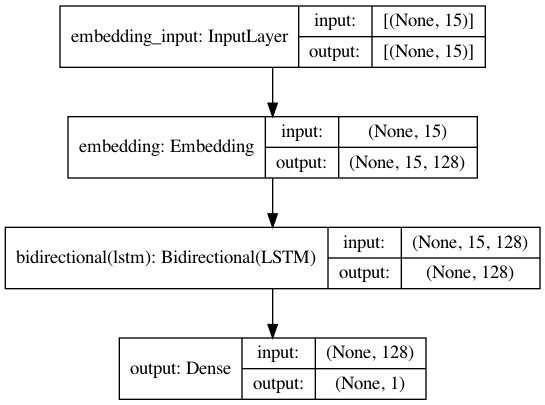

In [63]:
plot_model(models[0], show_shapes=True)

In [64]:
## Retrieve the summary of results from the tuner
tuner.results_summary()

## Explanation

### Train Model with the Tuned Hyperparameters

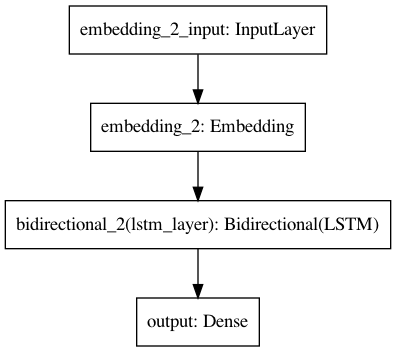

In [84]:
EMBEDDING_DIM = 128
HIDDEN_STATE= 128
model6 = Sequential()
model6.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model6.add(
    layers.Bidirectional(
        layers.LSTM(HIDDEN_STATE,
                    activation="relu",
                    name="lstm_layer",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model6.add(layers.Dense(1, activation="sigmoid", name="output"))

model6.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])
plot_model(model6)

In [85]:
history6 = model6.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 10s - loss: 0.6440 - accuracy: 0.6247 - val_loss: 0.5754 - val_accuracy: 0.6499
Epoch 2/20
40/40 - 3s - loss: 0.5328 - accuracy: 0.7252 - val_loss: 0.4863 - val_accuracy: 0.7648
Epoch 3/20
40/40 - 3s - loss: 0.4672 - accuracy: 0.7667 - val_loss: 0.4344 - val_accuracy: 0.7876
Epoch 4/20
40/40 - 4s - loss: 0.4428 - accuracy: 0.7858 - val_loss: 0.4217 - val_accuracy: 0.7978
Epoch 5/20
40/40 - 4s - loss: 0.4322 - accuracy: 0.7911 - val_loss: 0.4202 - val_accuracy: 0.7931
Epoch 6/20
40/40 - 4s - loss: 0.4282 - accuracy: 0.7968 - val_loss: 0.4162 - val_accuracy: 0.7915
Epoch 7/20
40/40 - 3s - loss: 0.4187 - accuracy: 0.8041 - val_loss: 0.4017 - val_accuracy: 0.8057
Epoch 8/20
40/40 - 3s - loss: 0.4120 - accuracy: 0.8009 - val_loss: 0.4006 - val_accuracy: 0.8009
Epoch 9/20
40/40 - 3s - loss: 0.4140 - accuracy: 0.8007 - val_loss: 0.3974 - val_accuracy: 0.8065
Epoch 10/20
40/40 - 3s - loss: 0.4056 - accuracy: 0.8084 - val_loss: 0.3968 - val_accuracy: 0.8080
Epoch 11/20
40/40 

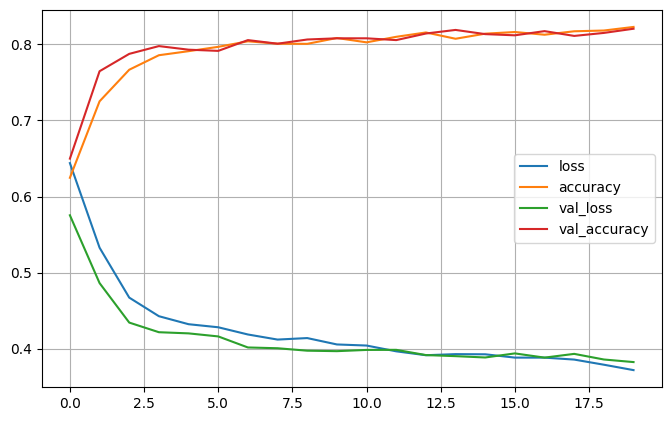

In [86]:
plot2(history6)

In [87]:
explainer = LimeTextExplainer(class_names=['male'], char_level=True)

In [88]:
def model_predict_pipeline(text):
    _seq = tokenizer.texts_to_sequences(text)
    _seq_pad = keras.preprocessing.sequence.pad_sequences(_seq, maxlen=max_len)
    #return np.array([[float(1-x), float(x)] for x in model.predict(np.array(_seq_pad))])
    return model6.predict(np.array(_seq_pad))

In [89]:
reversed_word_index = dict([(index, word)
                            for (word, index) in tokenizer.word_index.items()])

In [90]:
text_id = 305

In [91]:
X_test[text_id]

array([ 0,  0,  0,  0,  0,  0,  0,  0, 15,  2,  4,  4,  2,  8,  8],
      dtype=int32)

In [92]:
X_test_texts[text_id]

'Bennett'

In [93]:
' '.join([reversed_word_index.get(i, '?') for i in X_test[text_id]])

'? ? ? ? ? ? ? ? b e n n e t t'

In [94]:
model_predict_pipeline([X_test_texts[text_id]])

array([[0.20538217]], dtype=float32)

In [95]:
exp = explainer.explain_instance(X_test_texts[text_id],
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)

In [96]:
exp.show_in_notebook(text=True)

In [97]:
y_test[text_id]

1

In [98]:
exp = explainer.explain_instance('Tim',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [99]:
exp = explainer.explain_instance('Michaelis',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [100]:
exp = explainer.explain_instance('Sidney',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [101]:
exp = explainer.explain_instance('Timber',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [102]:
exp = explainer.explain_instance('Alvin',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

## References

- Chollet (2017), Ch 3 and  Ch 4